In [58]:
import re
import requests
import json
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
import wikipedia

# Lab 2.1
## Assignment 1

In [2]:
API_KEY = 'a61199fced9648c991fc5a43f0a7d7a2'

## Assignment 2

In [24]:
TOPIC = ["banana", "grape", "tomato"]
baseURL = "https://newsapi.org/v2/everything?"

### Get three different dictionaries.

In [92]:
BananaPost = {'apiKey': API_KEY,
            'q': '+'+TOPIC[0],
            'sortBy': 'relevancy',
            'totalRequests': 1}
BananaDic = requests.get(baseURL, BananaPost)
BananaDic = BananaDic.json() 


In [93]:
GrapePost = {'apiKey': API_KEY,
            'q': '+'+TOPIC[1],
            'sortBy': 'relevancy',
            'totalRequests': 1}
GrapeDic = requests.get(baseURL, GrapePost)
GrapeDic = GrapeDic.json() 


In [94]:
TomatoPost = {'apiKey': API_KEY,
            'q': '+'+TOPIC[2],
            'sortBy': 'relevancy',
            'totalRequests': 1}
TomatoDic = requests.get(baseURL, TomatoPost)
TomatoDic = TomatoDic.json() 

### Get title and description texts

In [95]:
def ExtractTitleAndDes(article_list):
    title = []
    description = []
    for article in article_list:
        title.append(article['title'])
        description.append(article['description'])
    return (" ".join(title), " ".join(description))

In [96]:
BananaArticles = BananaDic.get('articles')
BananaTitle, BananaDes = ExtractTitleAndDes(BananaArticles)

GrapeArticles = GrapeDic.get('articles')
GrapeTitle, GrapeDes = ExtractTitleAndDes(GrapeArticles)

TomatoArticles = TomatoDic.get('articles')
TomatoTitle, TomatoDes = ExtractTitleAndDes(TomatoArticles)

## Assignment 3

### Clean the texts

In [59]:
def string_cleaner(input_string):
    try: 
        out=re.sub(r"""
                    [,.;@#?!&$-]+  # Accept one or more copies of punctuation
                    \ *           # plus zero or more copies of a space,
                    """,
                    " ",          # and replace it with a single space
                    input_string, flags=re.VERBOSE)

        #REPLACE SELECT CHARACTERS WITH NOTHING
        out = re.sub('[’.]+', '', input_string)

        #ELIMINATE DUPLICATE WHITESPACES USING WILDCARDS
        out = re.sub(r'\s+', ' ', out)

        #CONVERT TO LOWER CASE
        out=out.lower()
    except:
        print("ERROR")
        out=''
    return out

In [98]:
BananaTitle = string_cleaner(BananaTitle)
BananaDes = string_cleaner(BananaDes)
GrapeTitle = string_cleaner(GrapeTitle)
GrapeDes = string_cleaner(GrapeDes)
TomatoTitle = string_cleaner(TomatoTitle)
TomatoDes = string_cleaner(TomatoDes)


### Create word clouds

In [99]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

In [101]:
def generate_word_cloud(my_text):
    # Define a function to plot word cloud
    def plot_cloud(wordcloud):
        # Set figure size
        plt.figure(figsize=(40, 30))
        # Display image
        plt.imshow(wordcloud) 
        # No axis details
        plt.axis("off");

    # Generate word cloud
    wordcloud = WordCloud(
        width = 3000,
        height = 2000, 
        random_state=1, 
        background_color='salmon', 
        colormap='Pastel1', 
        collocations=False,
        stopwords = STOPWORDS).generate(my_text)
    plot_cloud(wordcloud)
    plt.show()

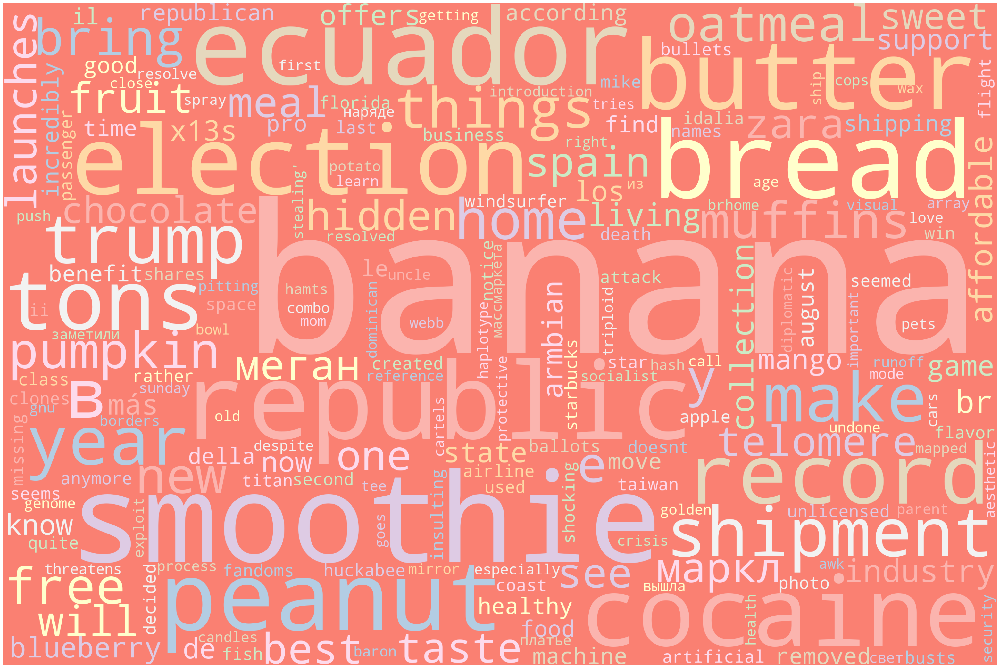

In [103]:
generate_word_cloud(BananaTitle)

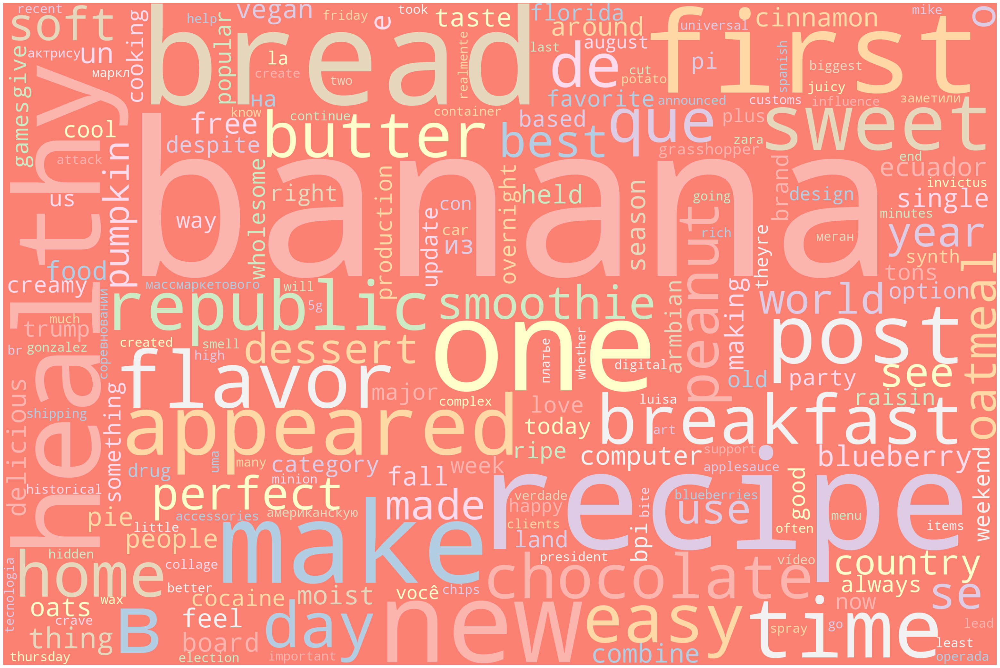

In [104]:
generate_word_cloud(BananaTitle)

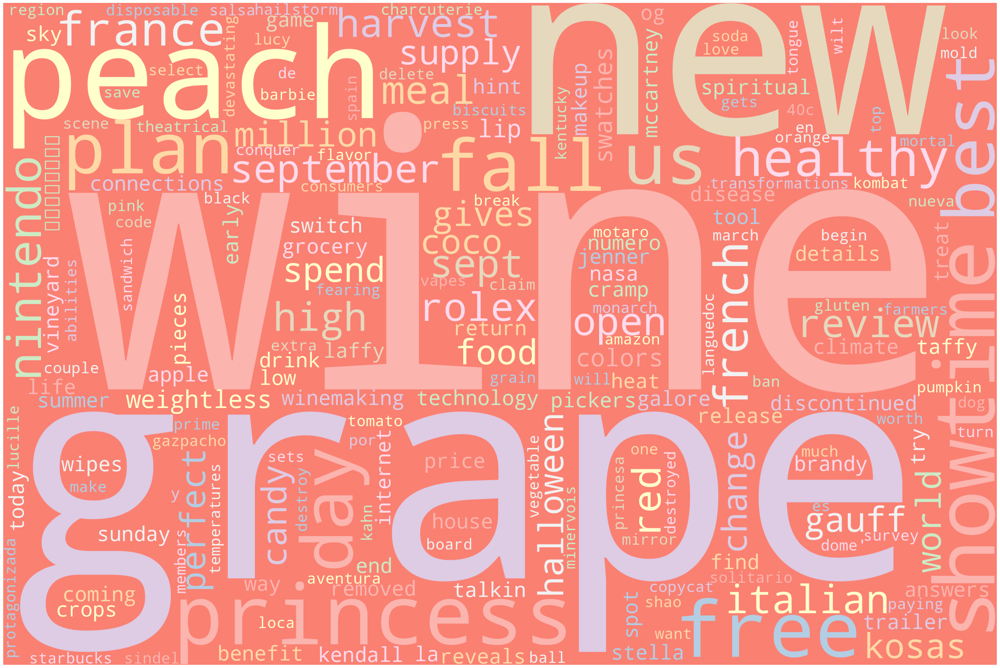

In [105]:
generate_word_cloud(GrapeTitle)

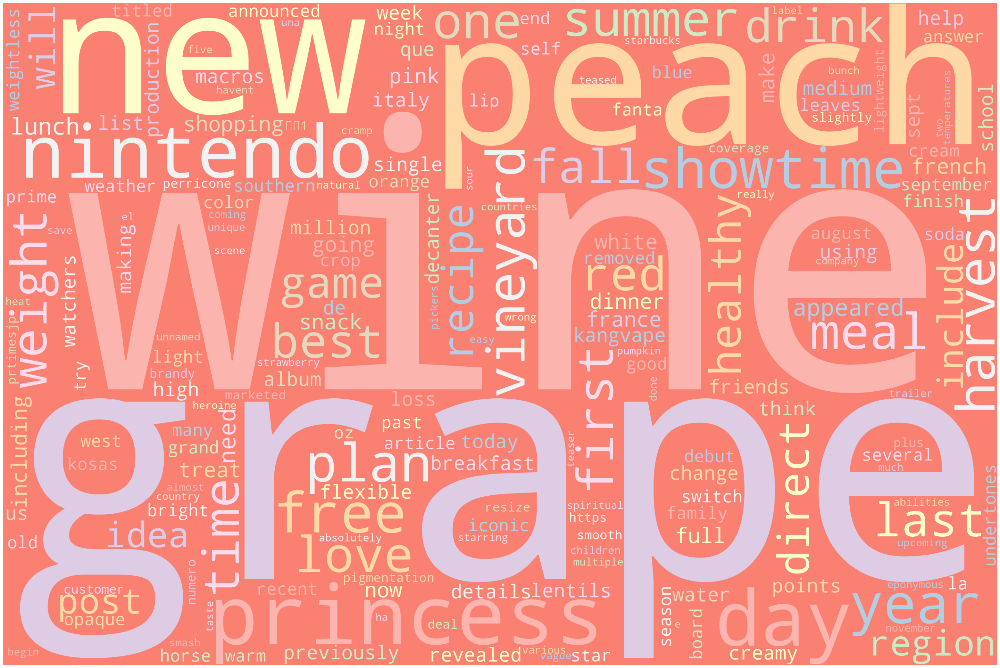

In [106]:
generate_word_cloud(GrapeDes)

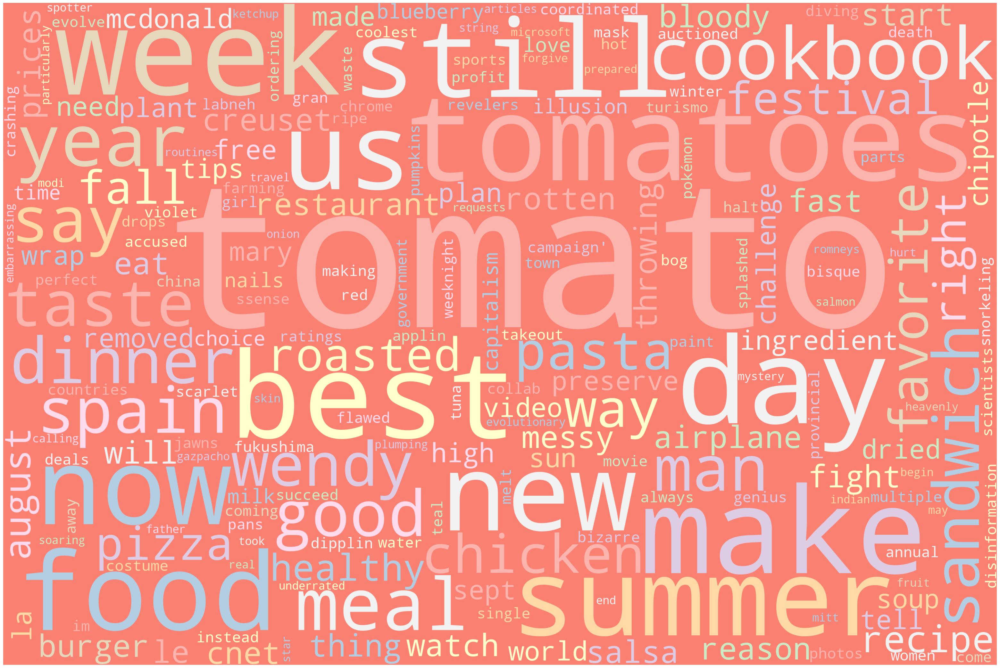

In [108]:
generate_word_cloud(TomatoTitle)

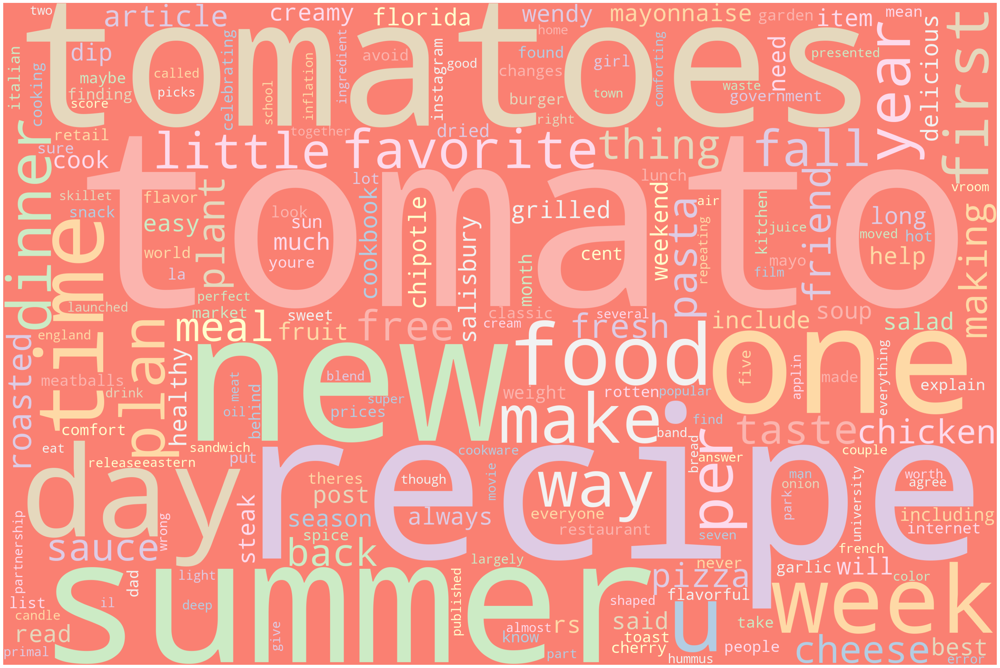

In [109]:
generate_word_cloud(TomatoDes)